<a href="https://colab.research.google.com/github/edri-avichai/Practical-Deep-Learning-Workshop-Assignment-4/blob/main/ass4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# installs
!pip install lightning>=2.0
!pip install -U "neptune-client<1.0.0" pytorch-lightning --quiet
!pip install neptune-tensorflow-keras
!pip install neptune-contrib
!pip install textblob


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 448.8/448.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 97.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.7/67.7 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.2/74.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for neptune-contrib

In [ ]:
from google.colab import files
from torch.utils.data import Subset
from torch import nn, Generator, stack, tensor, argmax, optim, device, cuda, no_grad, cat, exp
from torch.utils.data import DataLoader, random_split, SubsetRandomSampler,Subset, Dataset
from torchvision import datasets, transforms
import lightning as L

import os
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from keras.utils import load_img, img_to_array
import  tensorflow as tf
import torch
import numpy as np
import time

In [ ]:
# connecting to local file system to upload files 
# uploaded = files.upload()
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!kaggle datasets download -d zaraks/pascal-voc-2007

100% 1.65G/1.65G [00:56<00:00, 32.6MB/s]
100% 1.65G/1.65G [00:56<00:00, 31.6MB/s]


In [ ]:
default_path = "/content/pascal-voc-2007.zip"

In [ ]:
!unzip "/content/pascal-voc-2007.zip"

Streaming output truncated to the last 5000 lines.
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001729.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001730.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001732.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001733.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001734.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001738.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001739.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001741.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001746.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001747.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001749.jpg  
  inflating: voctrainval_06-nov-2007/VOCdevkit/VOC2007/JPEGImages/001750.jpg  
 

In [ ]:
! mkdir images
! mkdir images/train
! mkdir images/test
! cp -r '/content/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/' 'images/train'
! cp -r '/content/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages/' 'images/test'

In [ ]:
training_set_path = '/content/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages'
test_set_path = '/content/VOCtest_06-Nov-2JPEGImages007/VOCdevkit/VOC2007/JPEGImages'

In [ ]:
def plot_imgs(rows,cols,imgs,titles):
    """
        plots images side by side
    """
    fix,ax = plt.subplots(rows,cols,figsize=(20,12))
    for i in range(len(imgs)):
        if len(imgs)//cols > 1:
            ax[i//cols,i%cols].set_title(titles[i])
            ax[i//cols,i%cols].imshow(imgs[i])
        else:
            ax[i].set_title(titles[i])
            ax[i].imshow(imgs[i])

In [ ]:
class imagesDataset(Dataset):
    def __init__(self,path):
      self.x = datasets.ImageFolder(path, transform=transforms.Compose([transforms.Resize((72, 72)),transforms.ToTensor(),]))
      self.y_mid = datasets.ImageFolder(path, transform=transforms.Compose([transforms.Resize((144, 144)),transforms.ToTensor(),]))
      self.y_large = datasets.ImageFolder(path, transform=transforms.Compose([transforms.Resize((288, 288)),transforms.ToTensor(),]))

    def __len__(self):
        # return len(self.x)
        return 1000

    def __getitem__(self, index):

        return   self.x[index][0], self.y_mid[index][0],self.y_large[index][0]

In [ ]:
data_images = imagesDataset('/content/images/train')
test_images =imagesDataset('/content/images/test')

In [ ]:
train, validation = torch.utils.data.random_split(data_images, [0.8, 0.2], torch.Generator().manual_seed(42))


In [ ]:
train_loader = torch.utils.data.DataLoader(train, batch_size=20, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_images, batch_size=20, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation, batch_size=20, shuffle=False)

In [ ]:
train_loader.dataset[0][0].shape

torch.Size([3, 72, 72])

In [ ]:
class ConvForMid(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv1 = nn.Conv2d(3,64,3,padding='same') 
        self.conv2 = nn.Conv2d(64,64,3,padding='same')
        self.up = nn.Upsample(scale_factor=2)
        self.conv3 = nn.Conv2d(64,3,1,padding='same')
        self.relu = nn.LeakyReLU(0.01)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.up(x)
        x = self.conv3(x)
        # x= x.transpose(1,-1)
        x = self.relu(x)
        return x
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss = mse(preds , y_mid)

        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss = mse(preds , y_mid)

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss = mse(preds , y_mid)

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}
    
    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


In [ ]:
ConvForMid_model= ConvForMid()
trainer = L.Trainer(max_epochs=5,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(ConvForMid_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(ConvForMid_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name  | Type      | Params
------------------------------------
0 | conv1 | Conv2d    | 1.8 K 
1 | conv2 | Conv2d    | 36.9 K
2 | up    | Upsample  | 0     
3 | conv3 | Conv2d    | 195   
4 | relu  | LeakyReLU | 0     
------------------------------------
38.9 K    Trainable params
0         Non-trainable params
38.9 K    Total params
0.156     Total estim

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (40) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test loss_epoch      │   0.006002926267683506    │
└───────────────────────────┴───────────────────────────┘

[{'test loss_epoch': 0.006002926267683506}]

In [ ]:
# len(predictions[4])

##compare pred

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

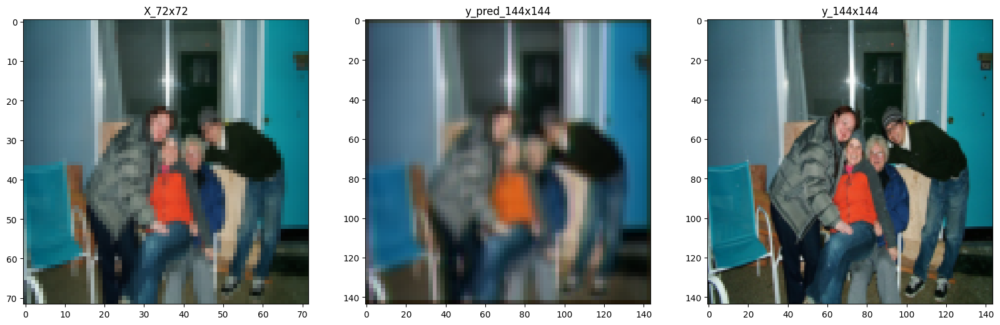

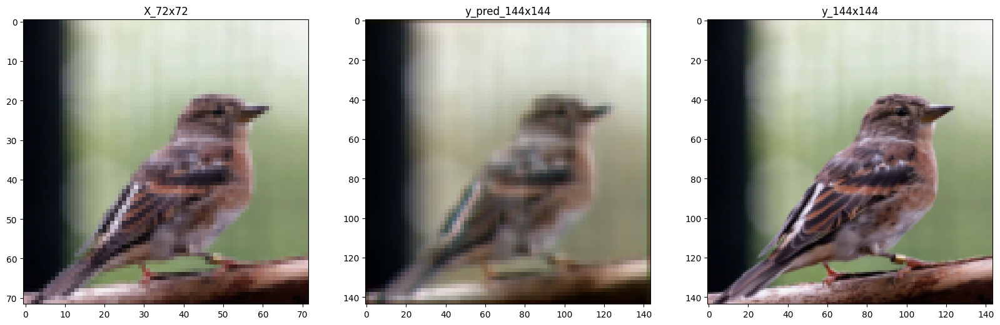

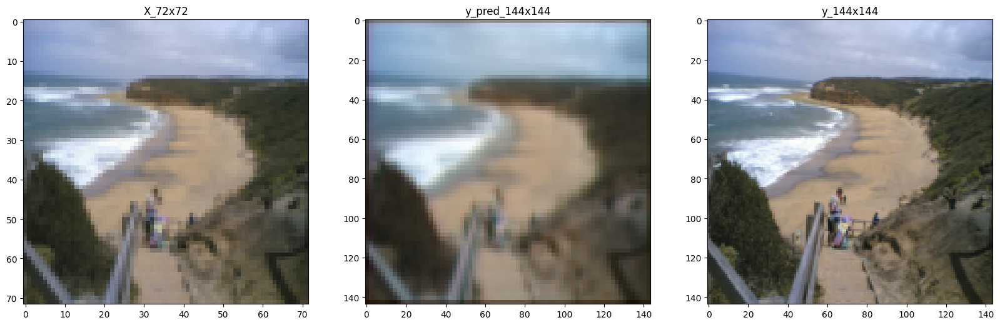

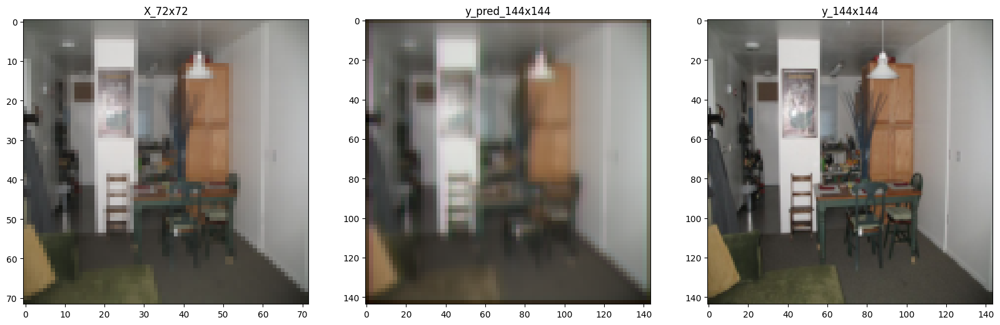

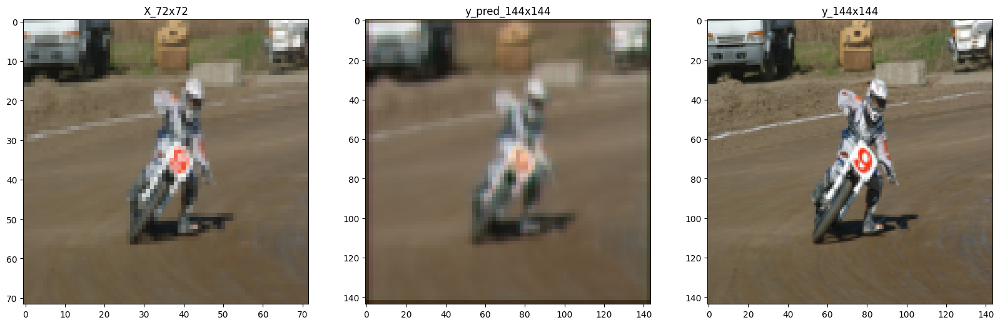

...

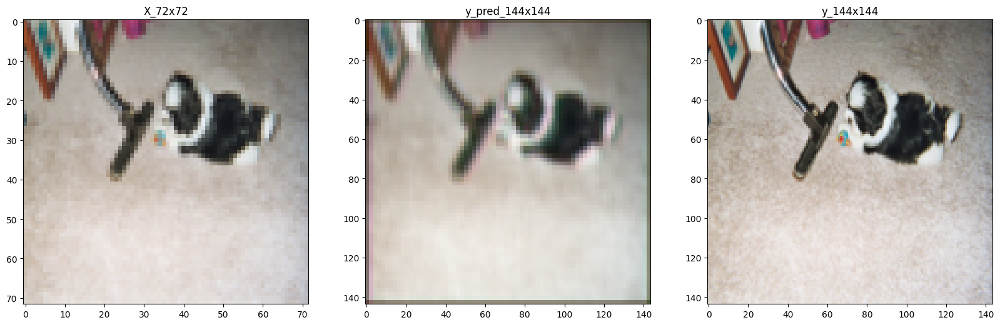

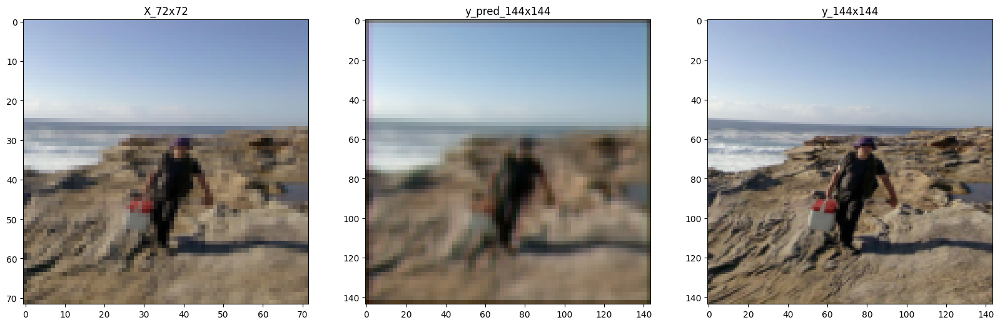

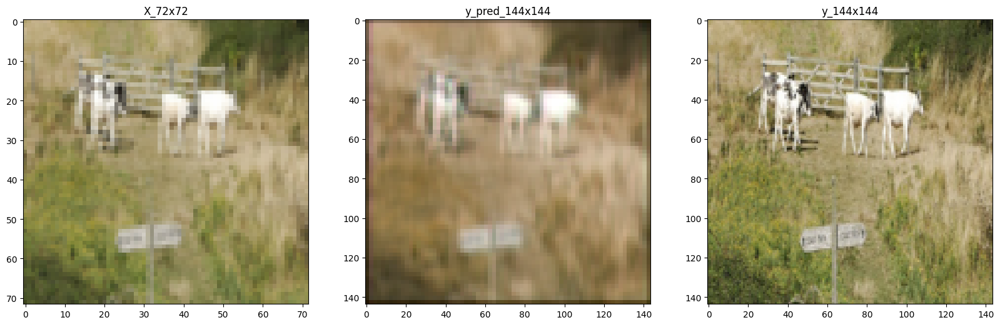

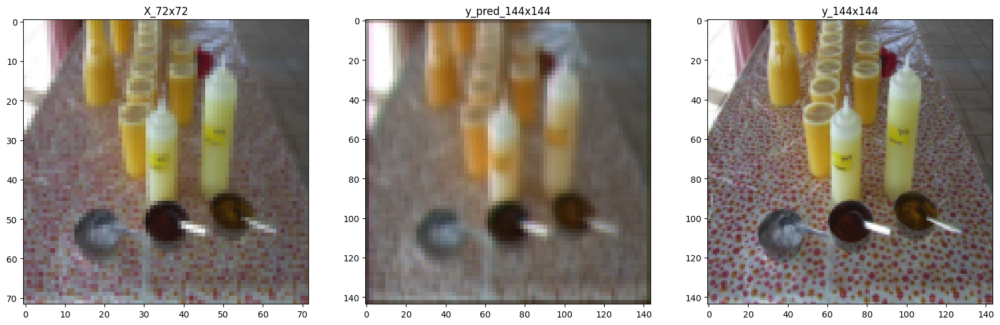

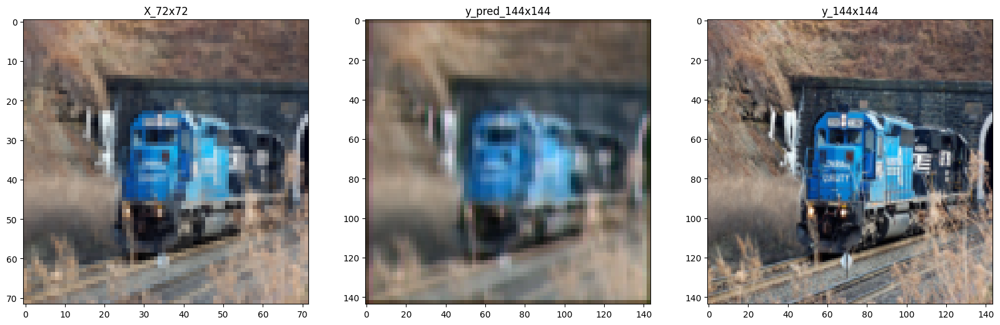

In [ ]:
predictions = trainer.predict(ConvForMid_model,validation_loader)
for i in range(len(predictions[0])):
    titles = ["X_72x72","y_pred_144x144", 'y_144x144']
    plot_imgs(1,3,[validation_loader.dataset[i][0].permute(1,2,0), predictions[0][i].permute(1,2,0), validation_loader.dataset[i][1].permute(1,2,0)],titles)
    

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

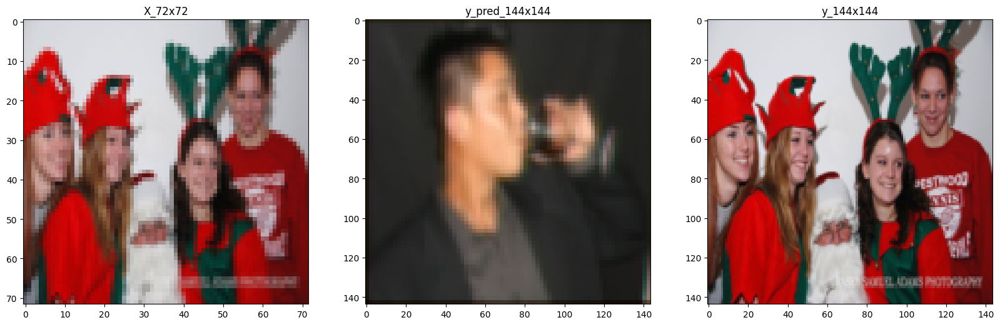

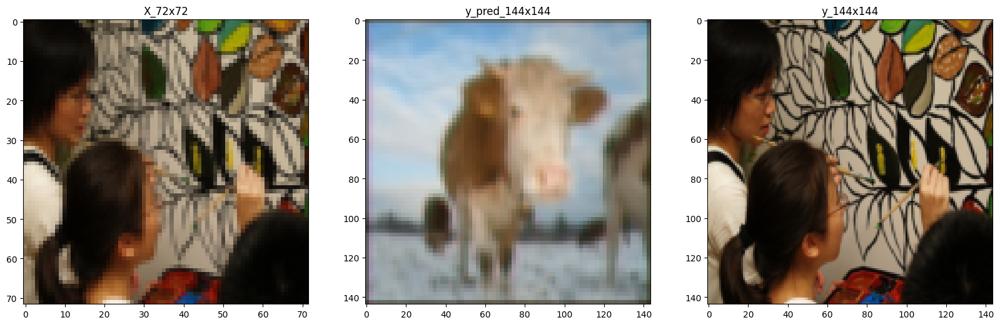

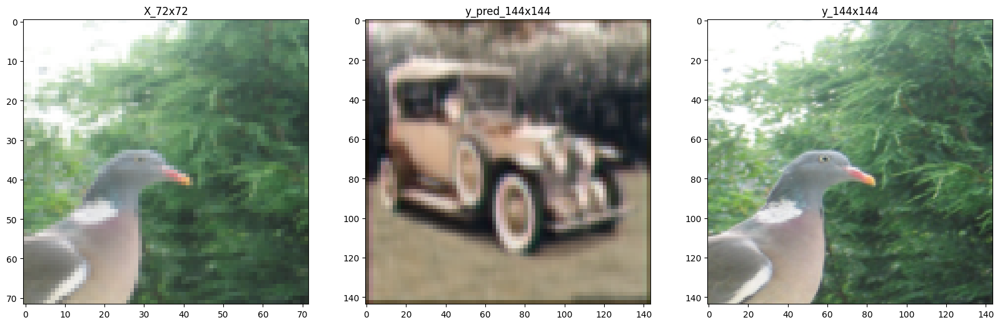

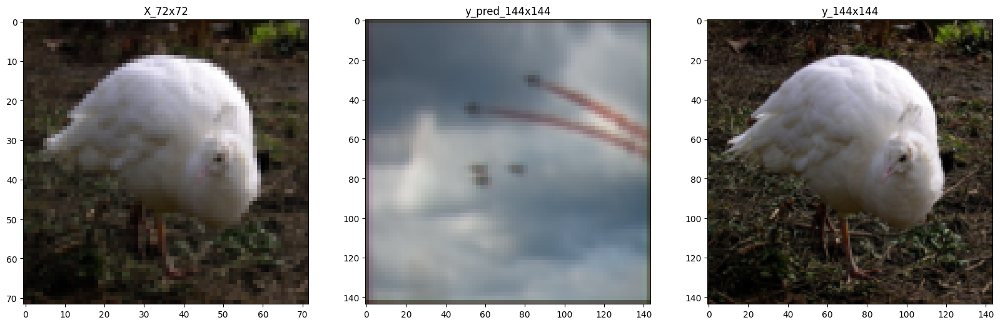

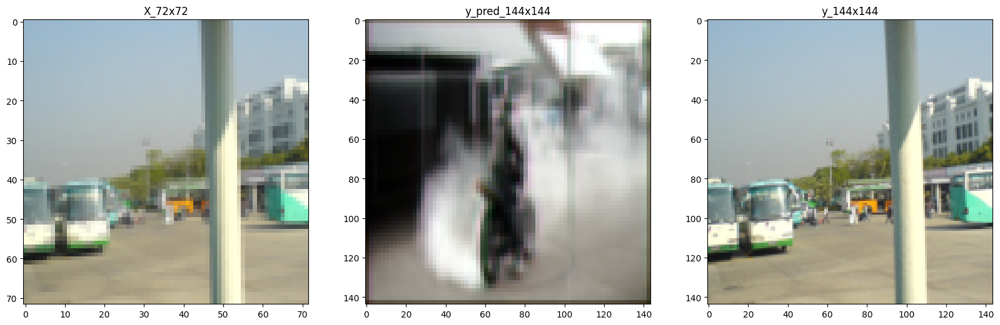

...

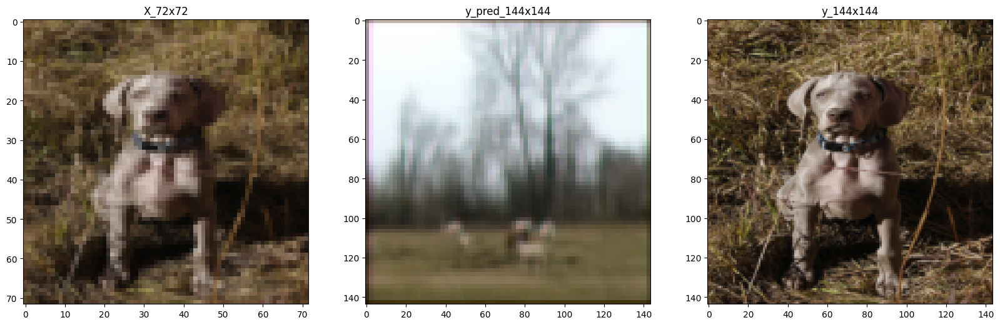

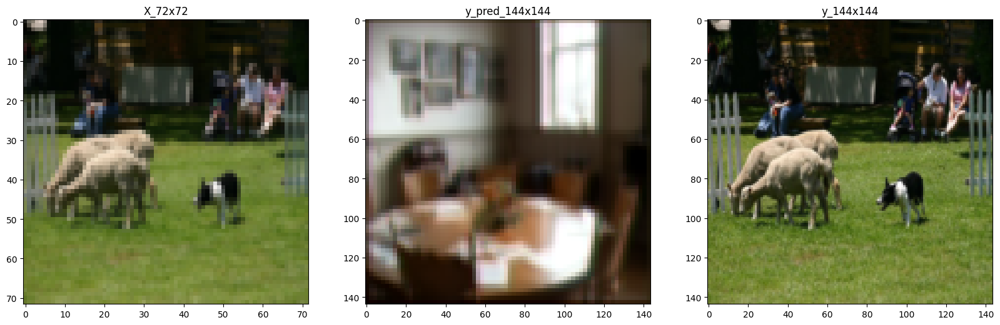

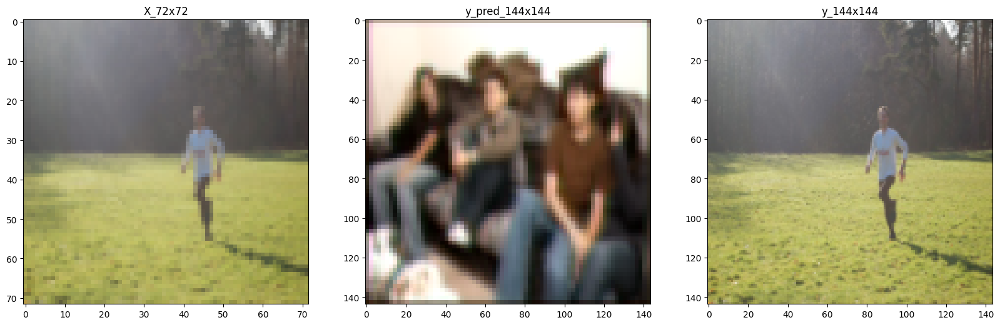

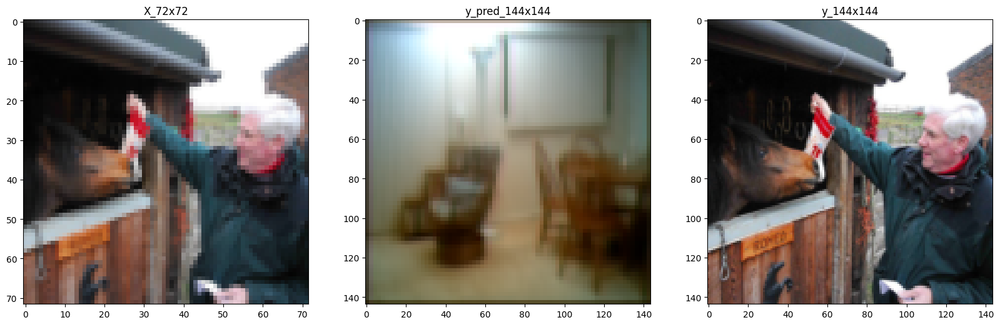

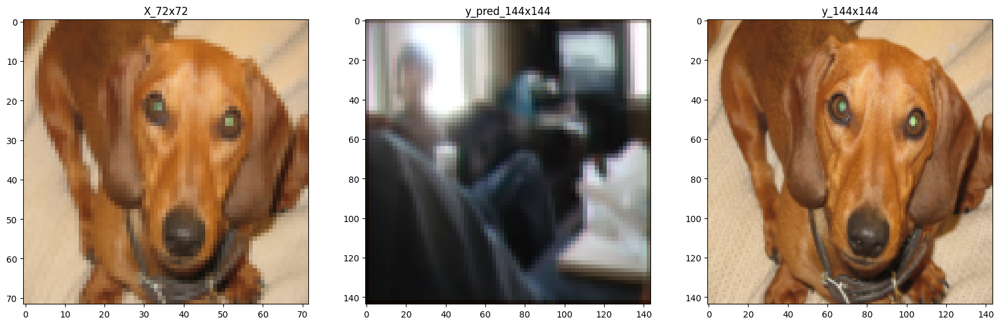

In [ ]:
predictions = trainer.predict(ConvForMid_model,train_loader)
for i in range(len(predictions[0])):
    titles = ["X_72x72","y_pred_144x144", 'y_144x144']
    plot_imgs(1,3,[train_loader.dataset[i][0].permute(1,2,0), predictions[0][i].permute(1,2,0), train_loader.dataset[i][1].permute(1,2,0)],titles)
    

# part 2

In [ ]:
class ConvrMidLarge(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv1 = nn.Conv2d(3,64,3,padding='same') 
        self.conv2 = nn.Conv2d(64,64,3,padding='same')
        self.up144 = nn.Upsample(scale_factor=2)
        self.conv144 = nn.Conv2d(64,3,1,padding='same')
        self.up288 = nn.Upsample(scale_factor=2)
        self.conv288 = nn.Conv2d(64,3,1,padding='same')


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.up144(x)
        x_up114 = self.conv144(x)
        x_up288= self.up288(x)
        x_up288 = self.conv288(x_up288)
        return x_up114, x_up288
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3


        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3
    
    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


In [ ]:
ConvrMidLarge_model= ConvrMidLarge()
trainer = L.Trainer(max_epochs=5,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(ConvrMidLarge_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(ConvrMidLarge_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params
-------------------------------------
0 | conv1   | Conv2d   | 1.8 K 
1 | conv2   | Conv2d   | 36.9 K
2 | up144   | Upsample | 0     
3 | conv144 | Conv2d   | 195   
4 | up288   | Upsample | 0     
5 | conv288 | Conv2d   | 195   
-------------------------------------
39.1 K    Trainable params
0         Non-trainable params
39.1

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

[{}]

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self):
        super(ResidualBlock, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(32, 32, kernel_size=3, padding='same')
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding='same')
        self.relu = nn.ReLU(inplace=True)

        
    def forward(self, x):
        residual = x
        
        out = self.conv1(x)        
        out = self.conv2(out)
        
        out += residual
        out = self.relu(out)
        
        return out

In [ ]:
class Residual_model(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv_1 = nn.Conv2d(3,32,3,padding='same') 

        self.res_block_1 = ResidualBlock()

        self.res_block_2 = ResidualBlock()




        self.up144 = nn.Upsample(scale_factor=2)
        self.conv144 = nn.Conv2d(32,3,1,padding='same')


        self.res_block_3 = ResidualBlock()


        self.up288 = nn.Upsample(scale_factor=2)
        self.conv288 = nn.Conv2d(32,3,1,padding='same')


    def forward(self, x):
        x = self.conv_1(x)
        block_1 = self.res_block_1(x)

        block_2 = self.res_block_2(x)

        x_up114 = self.up144(block_2)
        x_conv144 = self.conv144(x_up114)

        block_3 = self.res_block_3(x_up114)

        x_up288= self.up288(block_3)
        x_conv288 = self.conv288(x_up288)


        return x_conv144, x_conv288
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3


        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


In [ ]:
part_4a_model= Residual_model()
trainer = L.Trainer(max_epochs=5,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(part_4a_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(part_4a_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name        | Type          | Params
----------------------------------------------
0 | conv_1      | Conv2d        | 896   
1 | res_block_1 | ResidualBlock | 18.5 K
2 | res_block_2 | ResidualBlock | 18.5 K
3 | up144       | Upsample      | 0     
4 | conv144     | Conv2d        | 99    
5 | res_block_3 | ResidualBlock | 18.5 K
6 | up288       | Upsample  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test loss_epoch      │   0.007488989271223545    │
└───────────────────────────┴───────────────────────────┘

[{'test loss_epoch': 0.007488989271223545}]

## 4b -LeakyReLU

In [ ]:
class Residual_LeakyReLU_Block(nn.Module):
    def __init__(self):
        super(Residual_LeakyReLU_Block, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(32, 32, kernel_size=3, padding='same')
        self.conv2 = nn.Conv2d(32, 32, kernel_size=3, padding='same')
        self.relu = nn.LeakyReLU(0.1,inplace=True)

        
    def forward(self, x):
        residual = x
        
        out = self.conv1(x)        
        out = self.conv2(out)
        
        out += residual
        out = self.relu(out)
        
        return out

In [ ]:
class Residual_LeakyReLU_model(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv_1 = nn.Conv2d(3,32,3,padding='same') 

        self.res_block_1 = Residual_LeakyReLU_Block()

        self.res_block_2 = Residual_LeakyReLU_Block()




        self.up144 = nn.Upsample(scale_factor=2)
        self.conv144 = nn.Conv2d(32,3,1,padding='same')


        self.res_block_3 = Residual_LeakyReLU_Block()


        self.up288 = nn.Upsample(scale_factor=2)
        self.conv288 = nn.Conv2d(32,3,1,padding='same')


    def forward(self, x):
        x = self.conv_1(x)
        block_1 = self.res_block_1(x)

        block_2 = self.res_block_2(block_1)

        x_up114 = self.up144(block_2)
        x_conv144 = self.conv144(x_up114)

        block_3 = self.res_block_3(x_up114)

        x_up288= self.up288(block_3)
        x_conv288 = self.conv288(x_up288)


        return x_conv144, x_conv288
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3


        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return preds 

    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


In [ ]:
part_4b_model= Residual_LeakyReLU_model()
trainer = L.Trainer(max_epochs=5,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(part_4b_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(part_4b_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name        | Type                     | Params
---------------------------------------------------------
0 | conv_1      | Conv2d                   | 896   
1 | res_block_1 | Residual_LeakyReLU_Block | 18.5 K
2 | res_block_2 | Residual_LeakyReLU_Block | 18.5 K
3 | up144       | Upsample                 | 0     
4 | conv144     | Conv2d                   |

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test loss_epoch      │    0.00927276536822319    │
└───────────────────────────┴───────────────────────────┘

[{'test loss_epoch': 0.00927276536822319}]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

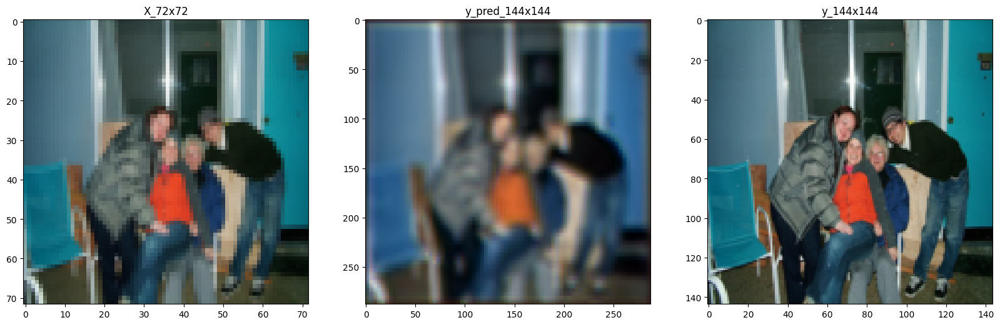

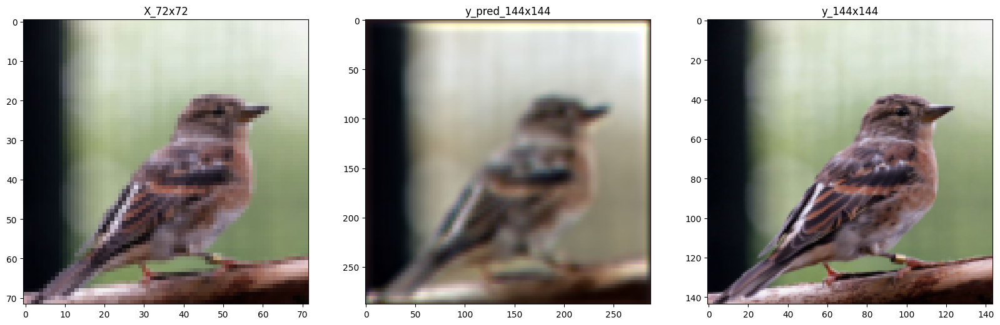

In [ ]:
predictions = trainer.predict(part_4b_model,validation_loader)
for i in range(len(predictions[0])):
    titles = ["X_72x72","y_pred_144x144", 'y_144x144']
    plot_imgs(1,3,[validation_loader.dataset[i][0].permute(1,2,0), predictions[0][1][i].permute(1,2,0), validation_loader.dataset[i][1].permute(1,2,0)],titles)

#part 5

In [ ]:
class Dilated_conv_block(nn.Module):
    def __init__(self):
        super(Dilated_conv_block, self).__init__()
        
        # Convolutional layers
        self.dilation_1 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =1)
        self.dilation_2 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =2)
        self.dilation_4 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =4)

        self.relu = nn.LeakyReLU(0.1,inplace=True)

        self.conv_1 = nn.Conv2d(96,32,3,padding='same') 

        
    def forward(self, x):
        x_dilation_1 = self.dilation_1(x)
        x_dilation_2 = self.dilation_2(x)
        x_dilation_4 = self.dilation_4(x)

        x = torch.cat((x_dilation_1, x_dilation_2,x_dilation_4),1)

        out = self.relu(x)
        
        out = self.conv_1(out)        
       
        
        
        return out

In [ ]:
class Dilated_conv_model(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv_1 = nn.Conv2d(3,32,3,padding='same') 

        self.dilation_block_1 = Dilated_conv_block()

        self.dilation_block_2 = Dilated_conv_block()


        self.up144 = nn.Upsample(scale_factor=2)
        self.conv144 = nn.Conv2d(32,3,1,padding='same')


        self.dilation_block_3 = Dilated_conv_block()


        self.up288 = nn.Upsample(scale_factor=2)
        self.conv288 = nn.Conv2d(32,3,1,padding='same')


    def forward(self, x):
        x = self.conv_1(x)
        block_1 = self.dilation_block_1(x)

        block_2 = self.dilation_block_2(block_1)

        x_up114 = self.up144(block_2)
        x_conv144 = self.conv144(x_up114)

        block_3 = self.dilation_block_3(x_up114)

        x_up288= self.up288(block_3)
        x_conv288 = self.conv288(x_up288)


        return x_conv144, x_conv288
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3


        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return preds 

    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer

In [ ]:
part_5_model= Dilated_conv_model()
trainer = L.Trainer(max_epochs=10,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(part_5_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(part_5_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type               | Params
--------------------------------------------------------
0 | conv_1           | Conv2d             | 896   
1 | dilation_block_1 | Dilated_conv_block | 55.4 K
2 | dilation_block_2 | Dilated_conv_block | 55.4 K
3 | up144            | Upsample           | 0     
4 | conv144          | Conv2d             | 99    

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test loss_epoch      │   0.005962668918073177    │
└───────────────────────────┴───────────────────────────┘

[{'test loss_epoch': 0.005962668918073177}]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

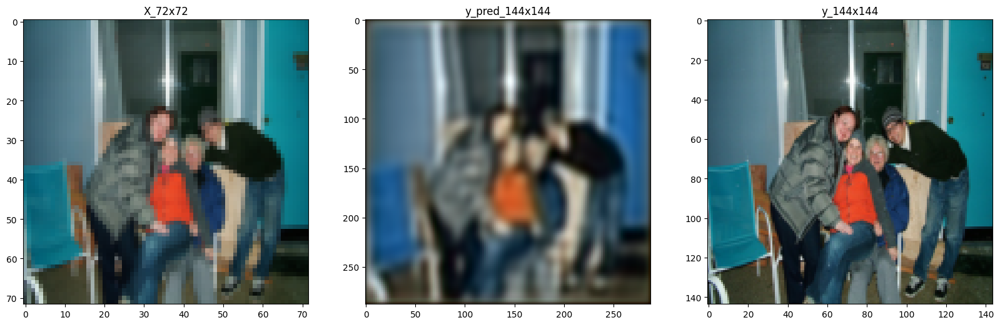

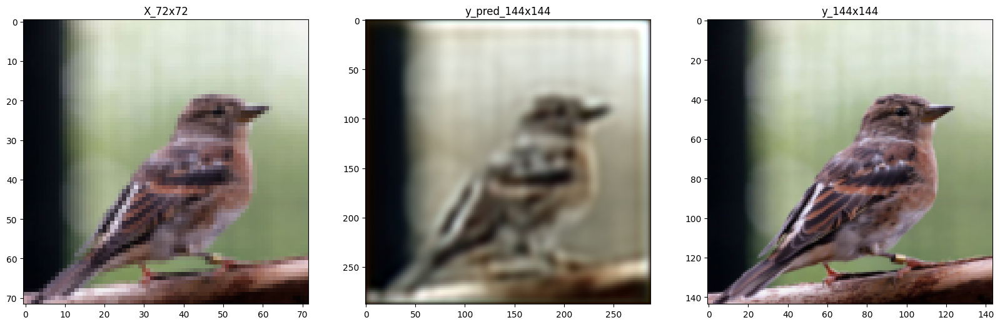

In [ ]:
predictions = trainer.predict(part_5_model,validation_loader)
for i in range(len(predictions[0])):
    titles = ["X_72x72","y_pred_144x144", 'y_144x144']
    plot_imgs(1,3,[validation_loader.dataset[i][0].permute(1,2,0), predictions[0][1][i].permute(1,2,0), validation_loader.dataset[i][1].permute(1,2,0)],titles)

#part 6

In [ ]:
class Dilated_conv_block(nn.Module):
    def __init__(self):
        super(Dilated_conv_block, self).__init__()
        
        # Convolutional layers
        self.dilation_1 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =1)
        self.dilation_2 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =2)
        self.dilation_4 = nn.Conv2d(32, 32, kernel_size=3, padding='same',dilation =4)

        self.relu = nn.LeakyReLU(0.1,inplace=True)

        self.conv_1 = nn.Conv2d(96,32,3,padding='same') 

        
    def forward(self, x):
        x_dilation_1 = self.dilation_1(x)
        x_dilation_2 = self.dilation_2(x)
        x_dilation_4 = self.dilation_4(x)

        x = torch.cat((x_dilation_1, x_dilation_2,x_dilation_4),1)

        out = self.relu(x)
        
        out = self.conv_1(out)        
       
        
        
        return out

In [ ]:
class Dilated_conv_model(L.LightningModule):
    def __init__(self, learning_rate=1e-4):
        super().__init__()

        # Set our init args as class attributes
        self.learning_rate = learning_rate

        # Hardcode some dataset specific attributes
        self.conv_1 = nn.Conv2d(3,32,3,padding='same') 

        self.dilation_block_1 = Dilated_conv_block()

        self.dilation_block_2 = Dilated_conv_block()


        self.up144 = nn.Upsample(scale_factor=2)
        self.conv144 = nn.Conv2d(32,3,1,padding='same')


        self.dilation_block_3 = Dilated_conv_block()


        self.up288 = nn.Upsample(scale_factor=2)
        self.conv288 = nn.Conv2d(32,3,1,padding='same')


    def forward(self, x):
        x = self.conv_1(x)
        block_1 = self.dilation_block_1(x)

        block_2 = self.dilation_block_2(block_1)

        x_up114 = self.up144(block_2)
        x_conv144 = self.conv144(x_up114)

        block_3 = self.dilation_block_3(x_up114)

        x_up288= self.up288(block_3)
        x_conv288 = self.conv288(x_up288)


        return x_conv144, x_conv288
   
    def training_step(self, batch, batch_idx): 
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3


        self.log(f'training loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss} 

    def validation_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'val loss', loss, on_epoch=True, on_step=True)
        return {'loss': loss}        

    def test_step(self, batch, batch_idx):
        x, y_mid, y_large = batch
        preds = self(x)
        
        mse = nn.MSELoss()
        loss144 = mse(preds[0] , y_mid)
        loss288 = mse(preds[1] , y_large)
        loss = 0.7* loss144 + loss288 * 0.3

        self.log(f'test loss', loss, on_epoch=True, on_step=True)
        return preds 

    def predict_step(self, batch, batch_idx):
        x, mid_y, large_y = batch
        output = self(x)
        return output

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer

In [ ]:
part_5_model= Dilated_conv_model()
trainer = L.Trainer(max_epochs=10,
                    # logger=neptune_logger,
                    enable_model_summary=True,
                    )
trainer.fit(part_5_model, train_dataloaders=train_loader, val_dataloaders=validation_loader)



trainer.test(part_5_model, dataloaders=test_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name             | Type               | Params
--------------------------------------------------------
0 | conv_1           | Conv2d             | 896   
1 | dilation_block_1 | Dilated_conv_block | 55.4 K
2 | dilation_block_2 | Dilated_conv_block | 55.4 K
3 | up144            | Upsample           | 0     
4 | conv144          | Conv2d             | 99    

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test loss_epoch      │   0.005962668918073177    │
└───────────────────────────┴───────────────────────────┘

[{'test loss_epoch': 0.005962668918073177}]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

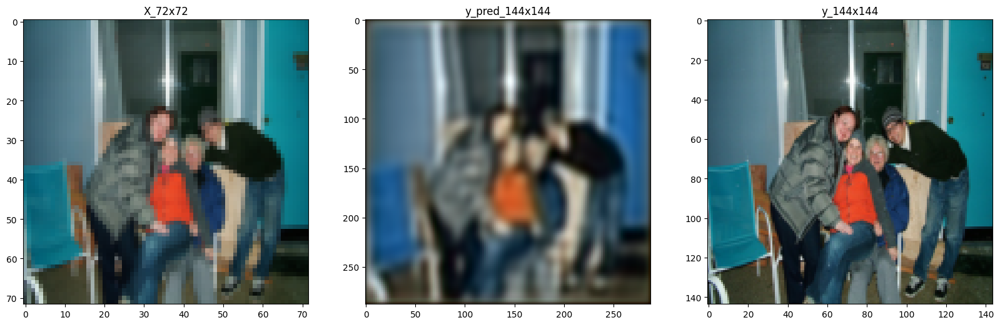

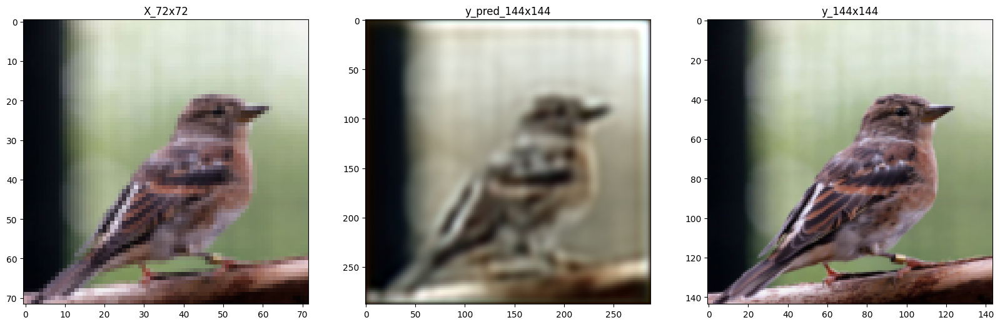

In [ ]:
predictions = trainer.predict(part_5_model,validation_loader)
for i in range(len(predictions[0])):
    titles = ["X_72x72","y_pred_144x144", 'y_144x144']
    plot_imgs(1,3,[validation_loader.dataset[i][0].permute(1,2,0), predictions[0][1][i].permute(1,2,0), validation_loader.dataset[i][1].permute(1,2,0)],titles)